<a href="https://colab.research.google.com/github/omj991102/sharedragon/blob/main/sharedragon.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os
import torch.nn.utils.prune as prune

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [ ]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [ ]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

In [ ]:
def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [ ]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

In [ ]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
#img_siren_1.cuda()

model_input, ground_truth = next(iter(dataloader))
#model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Step 0, Total loss 0.323660


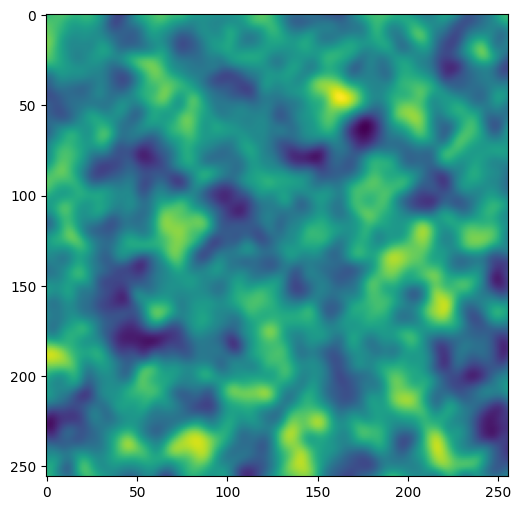

Step 10, Total loss 0.051639


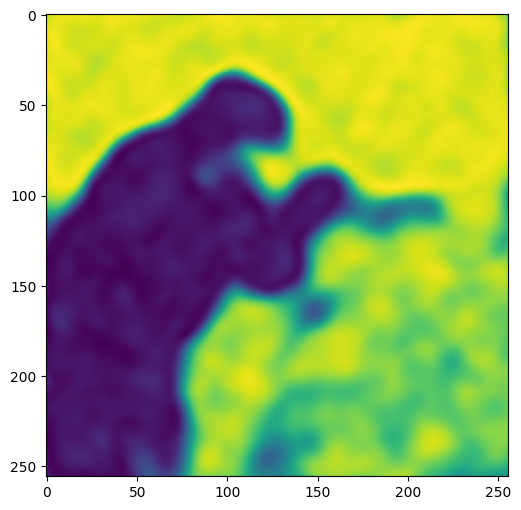

Step 20, Total loss 0.023031


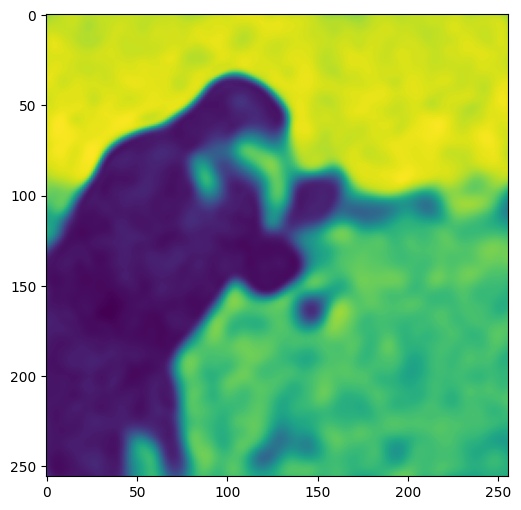

Step 30, Total loss 0.016683


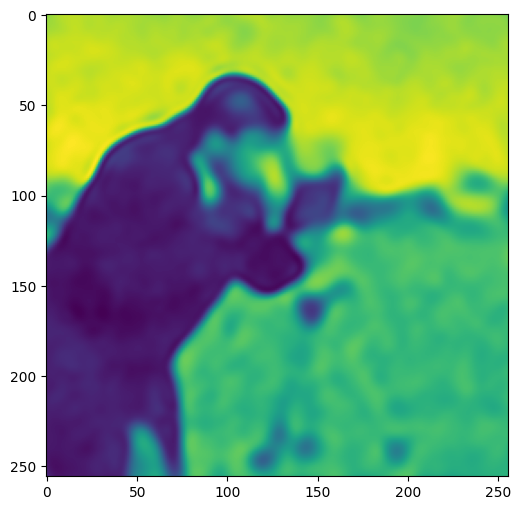

Step 40, Total loss 0.013749


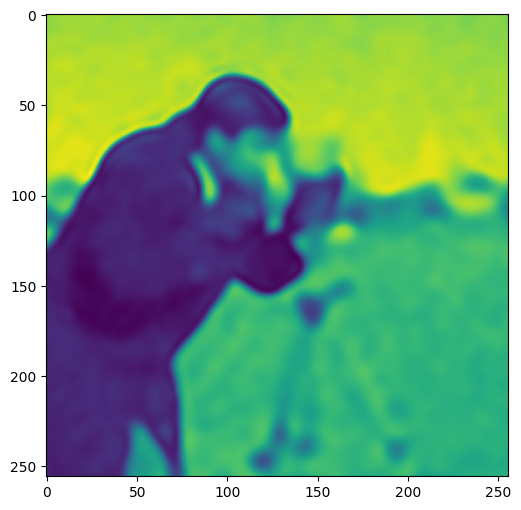

Step 50, Total loss 0.012151


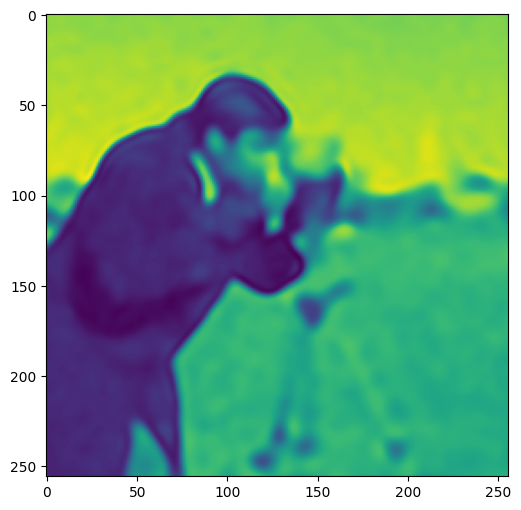

Step 60, Total loss 0.011042


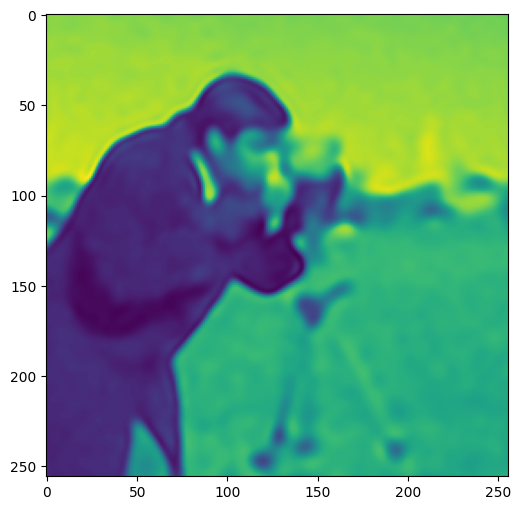

Step 70, Total loss 0.010165


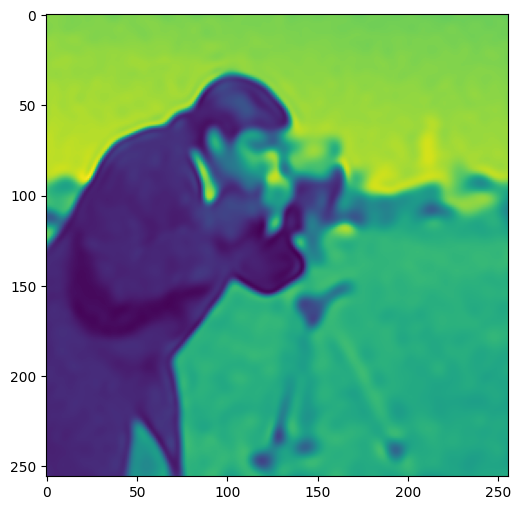

Step 80, Total loss 0.009409


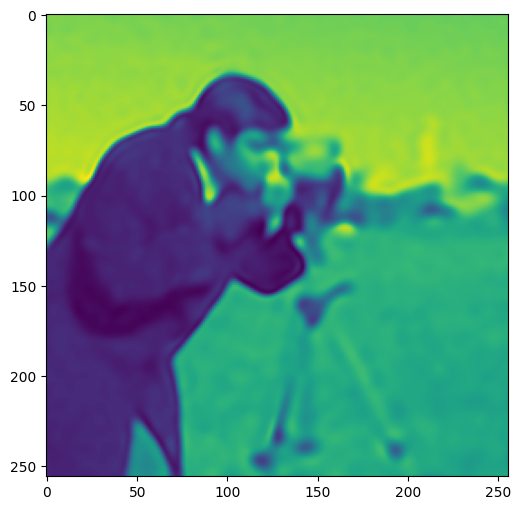

Step 90, Total loss 0.008735


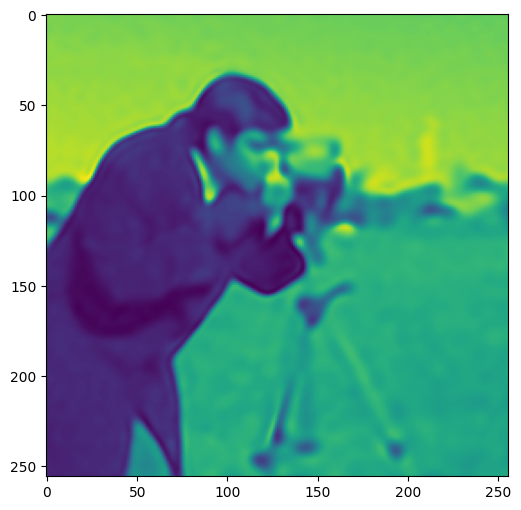

Step 100, Total loss 0.008129


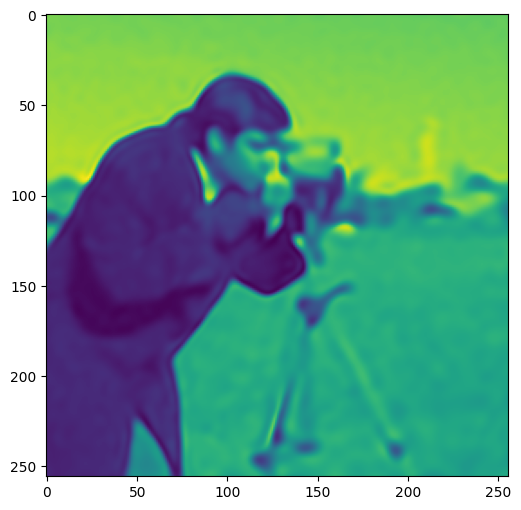

Step 110, Total loss 0.007588


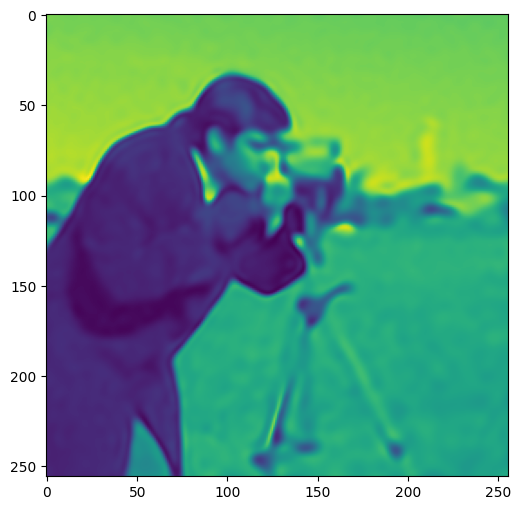

Step 120, Total loss 0.007103


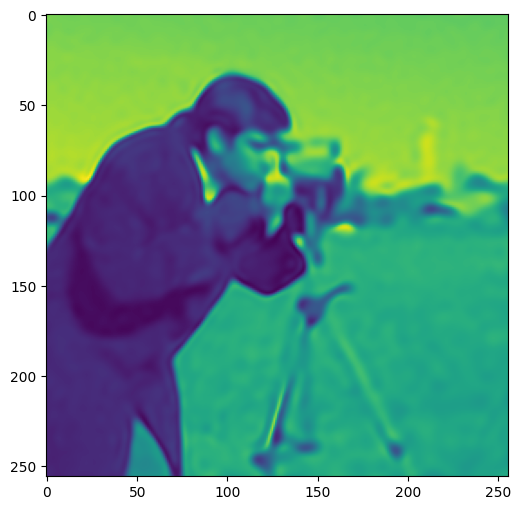

Step 130, Total loss 0.006660


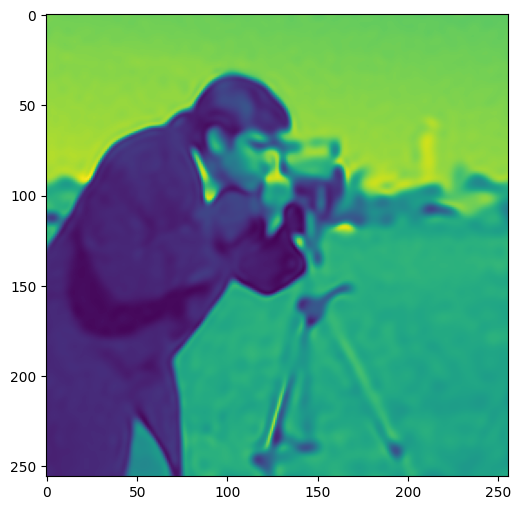

Step 140, Total loss 0.006248


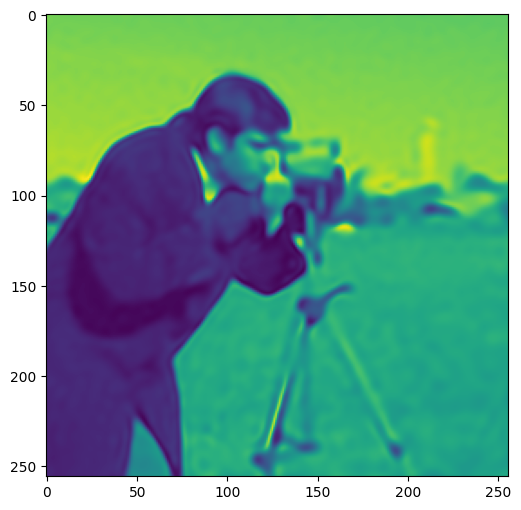

Step 150, Total loss 0.005862


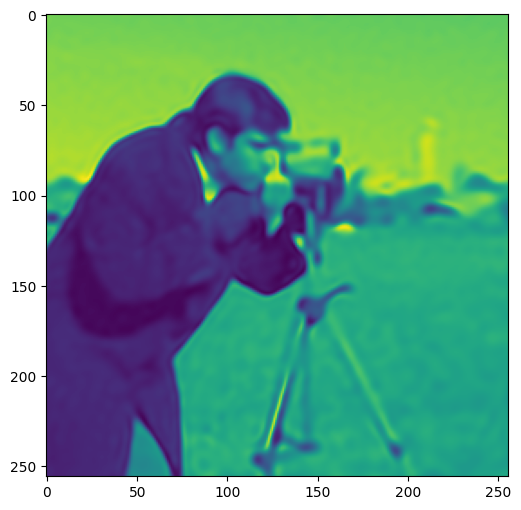

Step 160, Total loss 0.005495


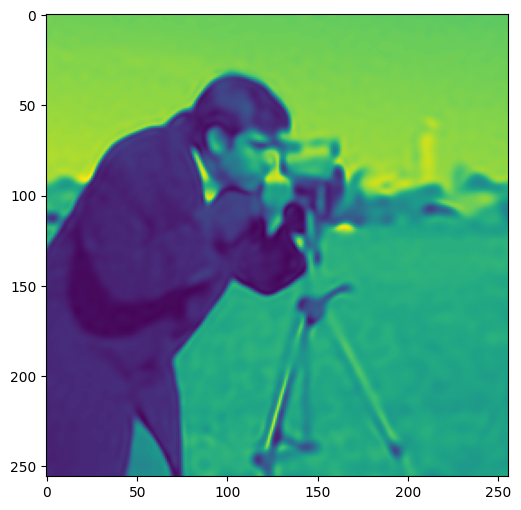

Step 170, Total loss 0.005138


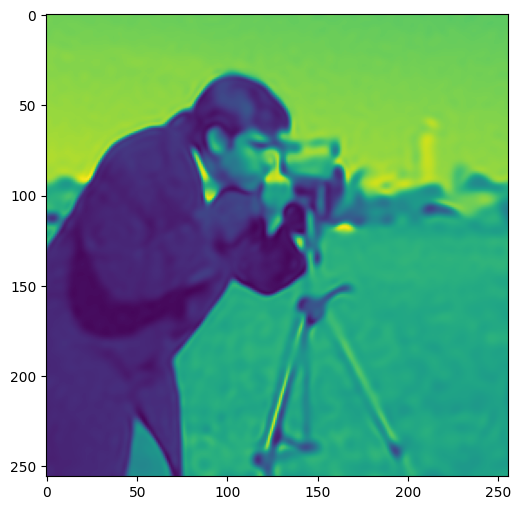

Step 180, Total loss 0.004782


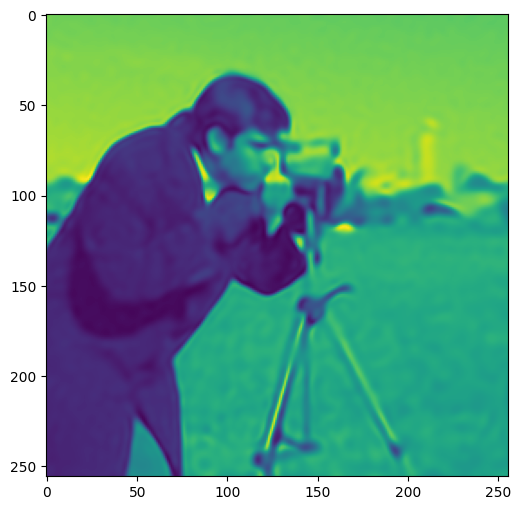

Step 190, Total loss 0.004420


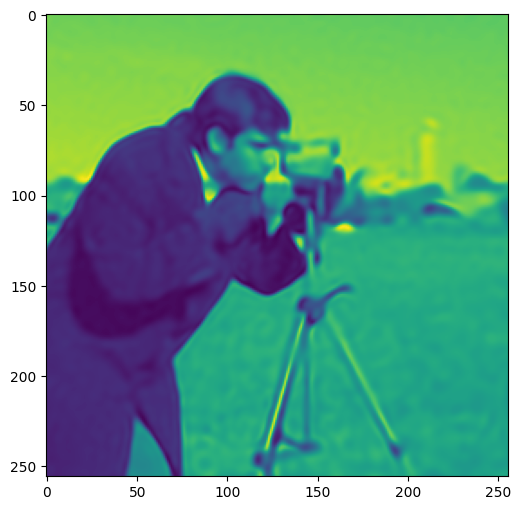

Step 200, Total loss 0.004051


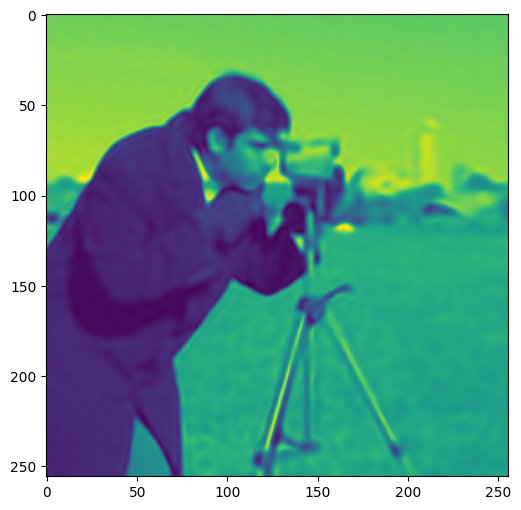

Step 210, Total loss 0.003700


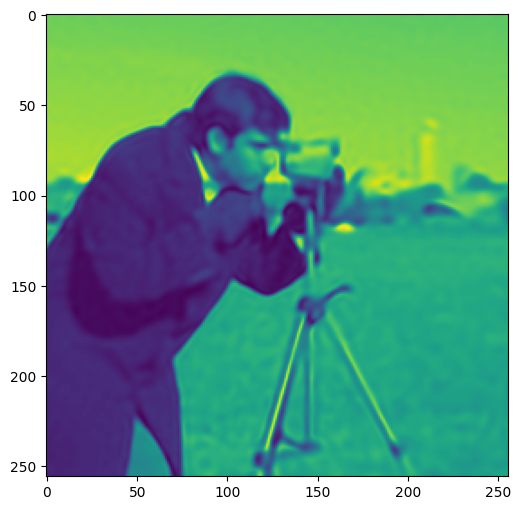

Step 220, Total loss 0.003384


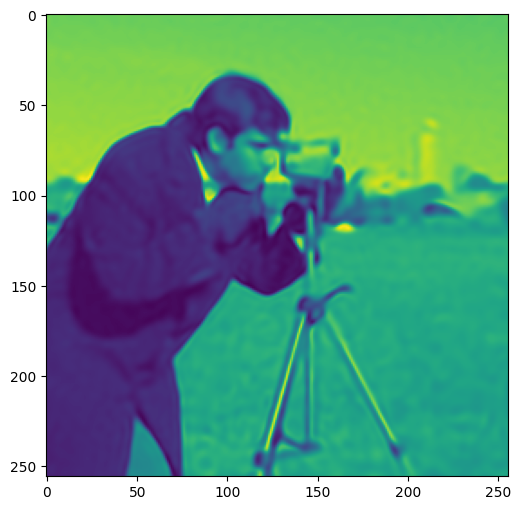

Step 230, Total loss 0.003111


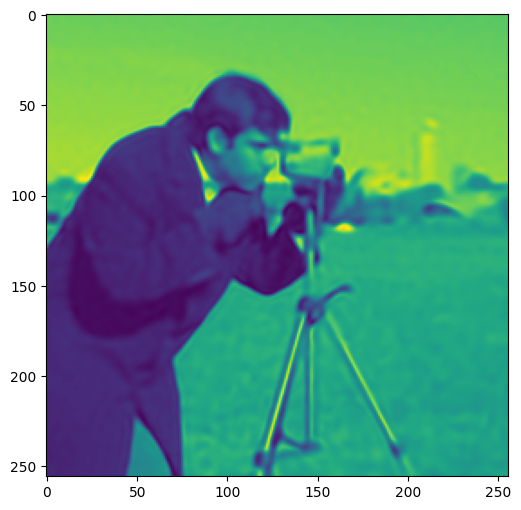

Step 240, Total loss 0.002878


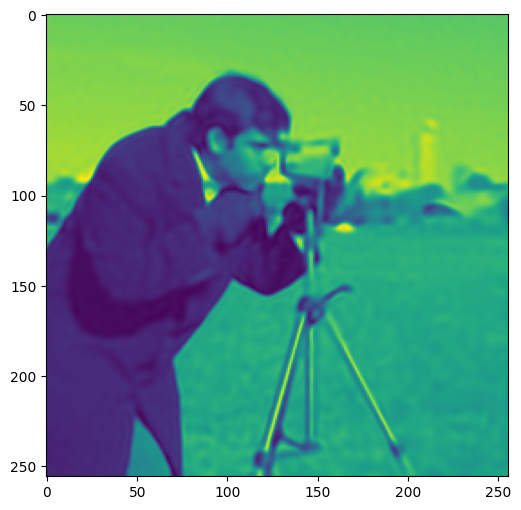

Step 250, Total loss 0.002679


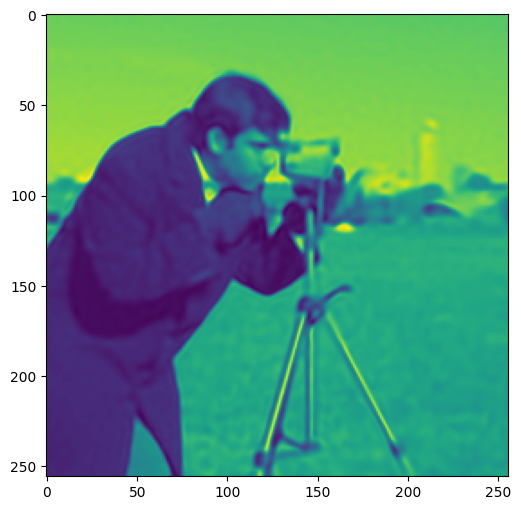

Step 260, Total loss 0.002506


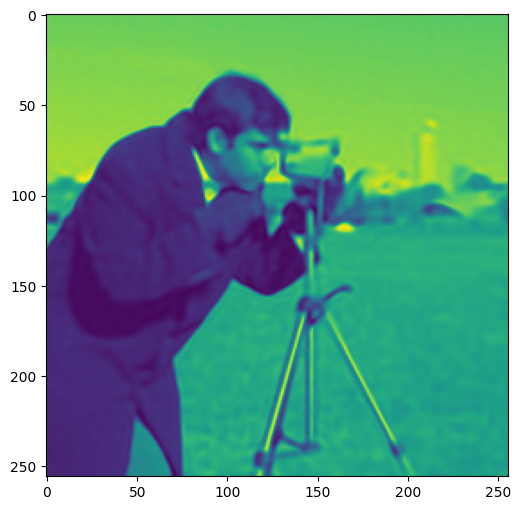

Step 270, Total loss 0.002357


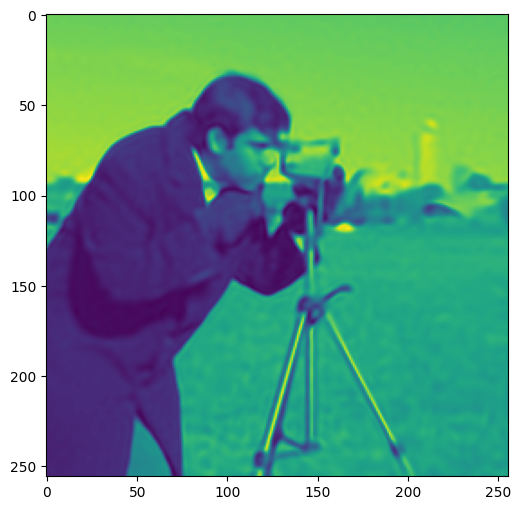

Step 280, Total loss 0.002224


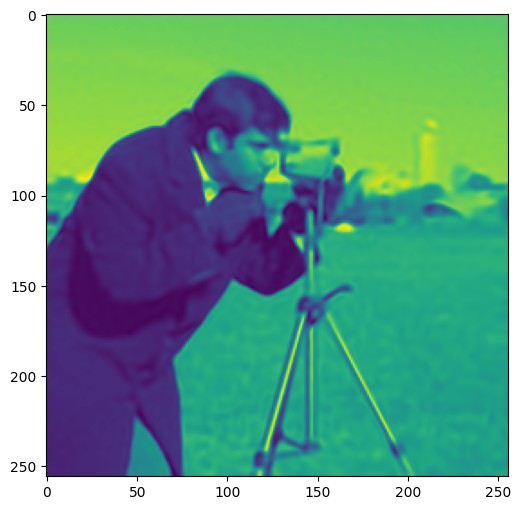

Step 290, Total loss 0.002106


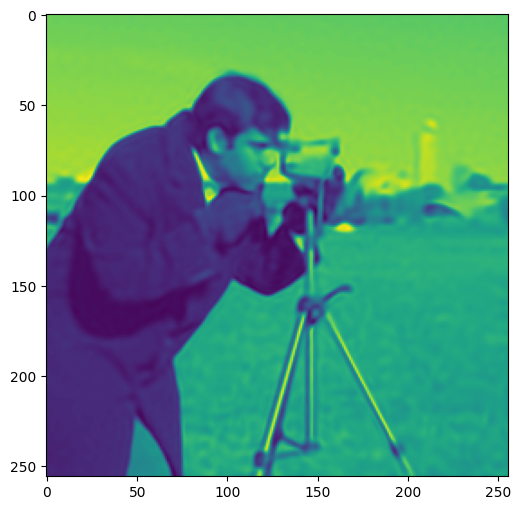

Step 300, Total loss 0.001998


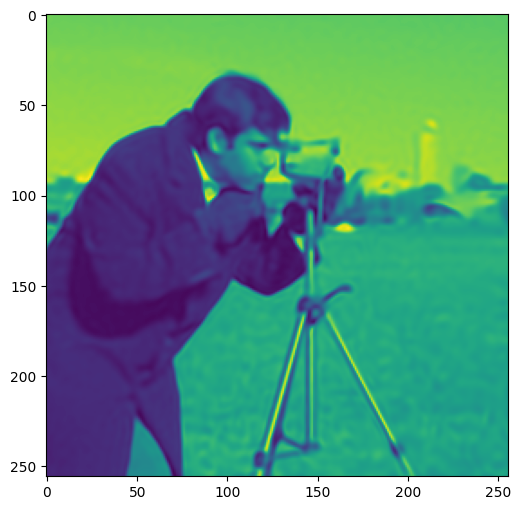

Step 310, Total loss 0.001901


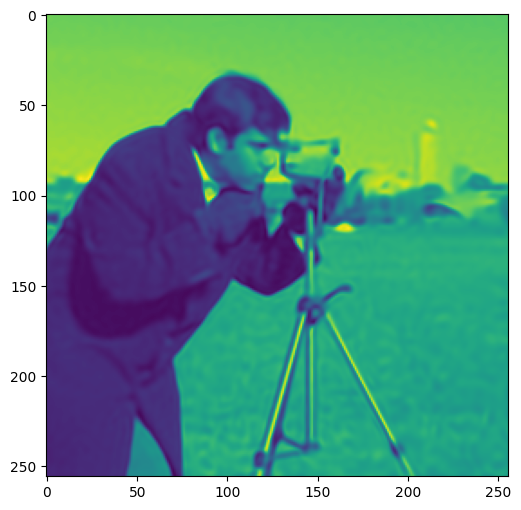

Step 320, Total loss 0.001811


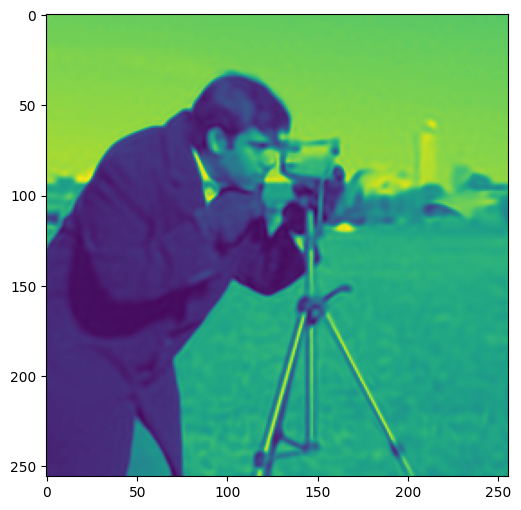

Step 330, Total loss 0.001729


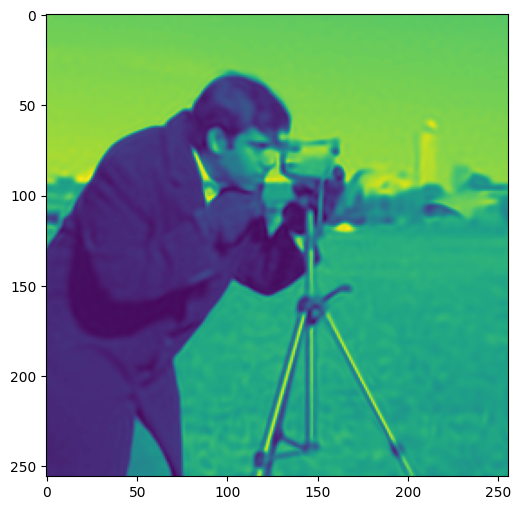

Step 340, Total loss 0.001653


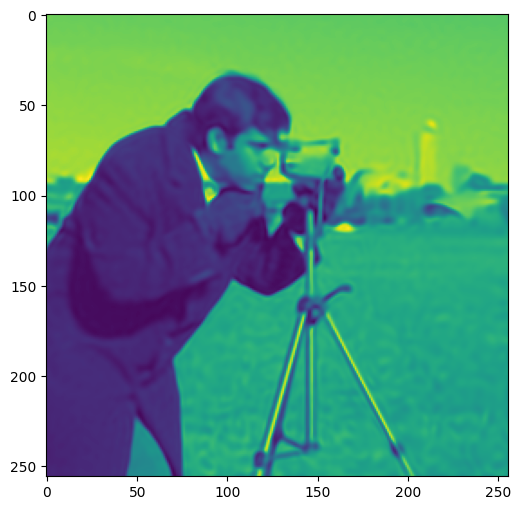

Step 350, Total loss 0.001583


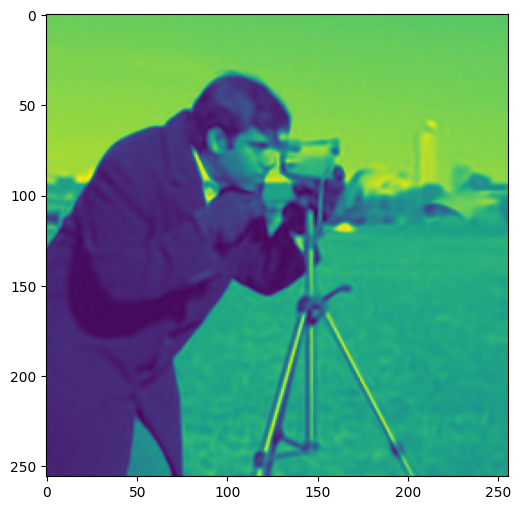

Step 360, Total loss 0.001520


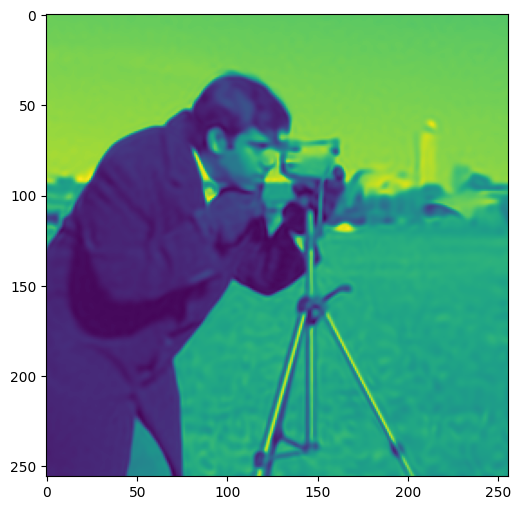

Step 370, Total loss 0.001463


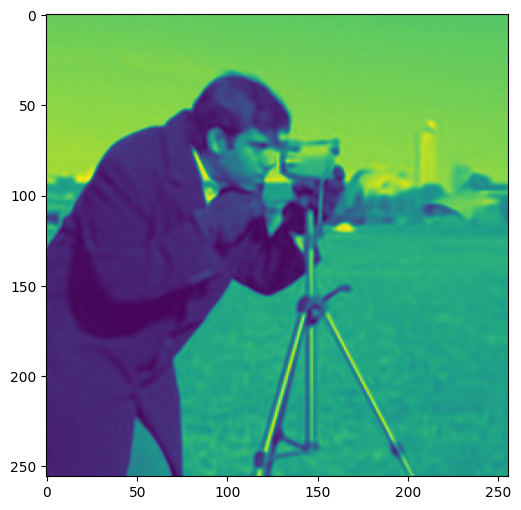

Step 380, Total loss 0.001456


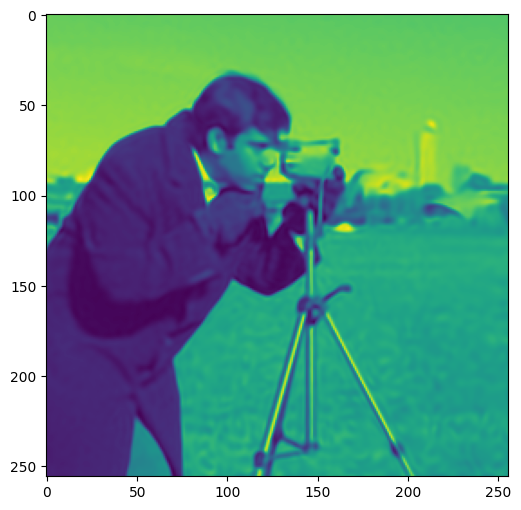

Step 390, Total loss 0.001367


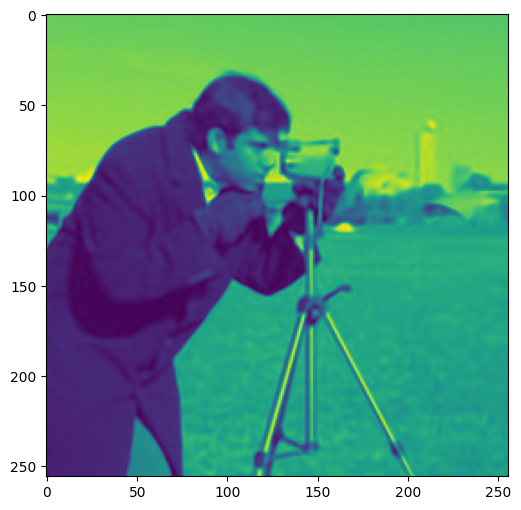

Step 400, Total loss 0.001318


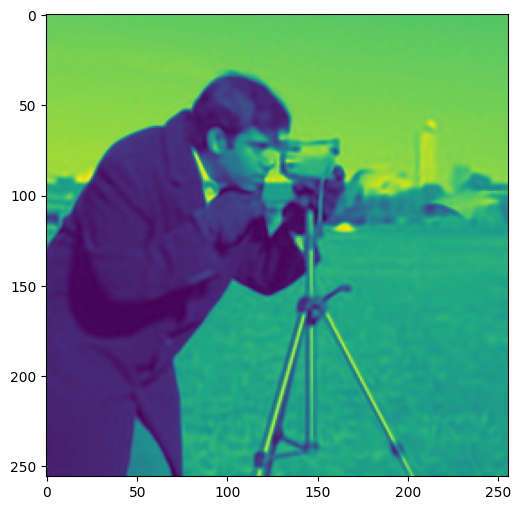

Step 410, Total loss 0.001272


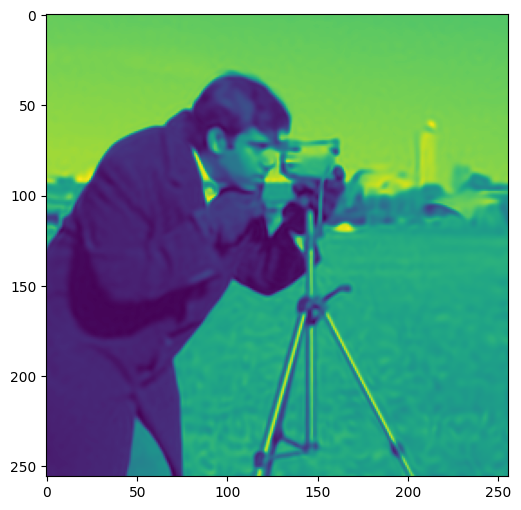

Step 420, Total loss 0.001232


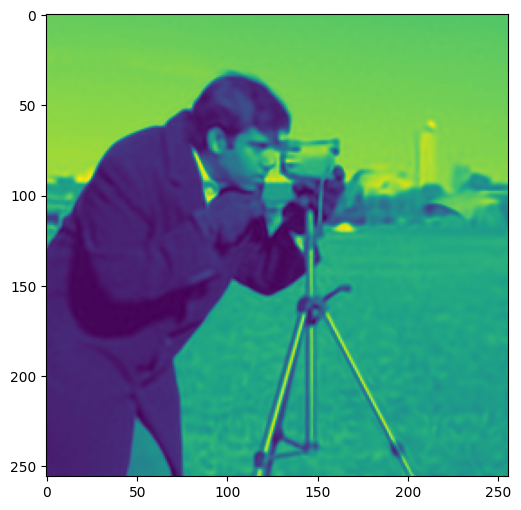

Step 430, Total loss 0.001194


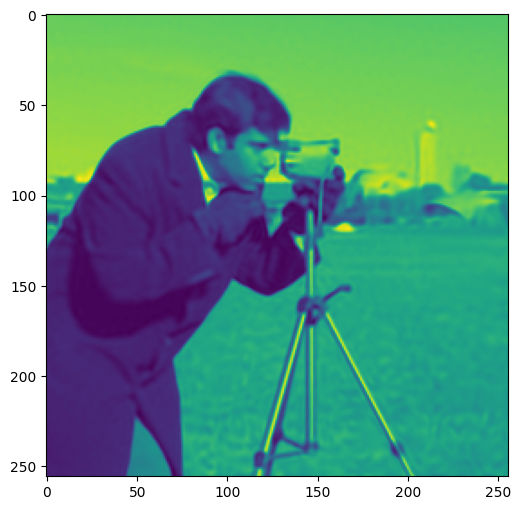

Step 440, Total loss 0.001159


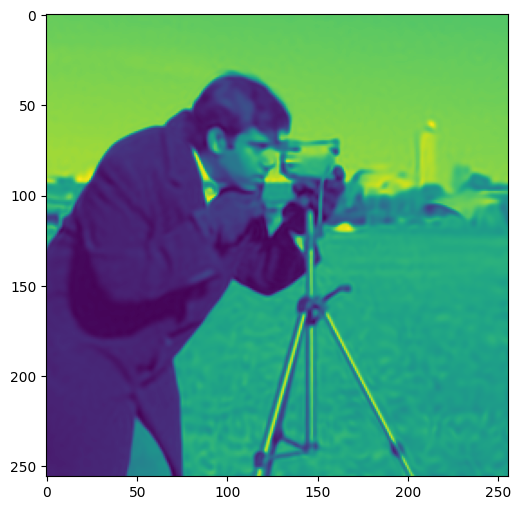

Step 450, Total loss 0.001125


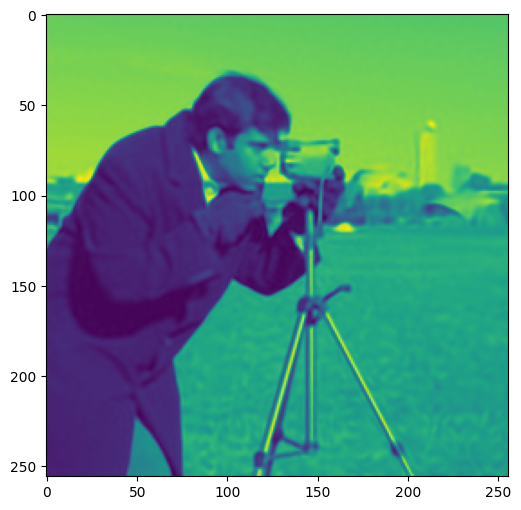

Step 460, Total loss 0.001094


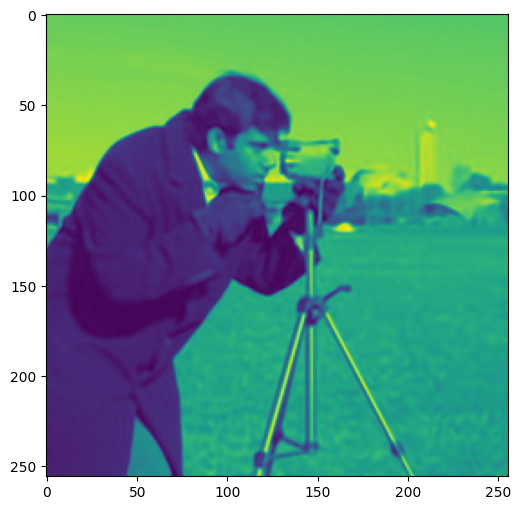

Step 470, Total loss 0.001064


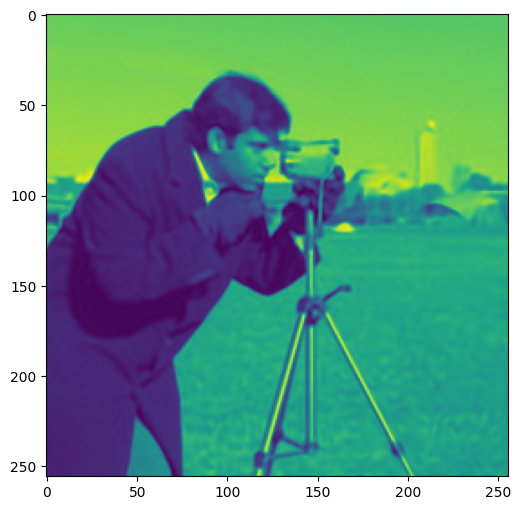

Step 480, Total loss 0.001036


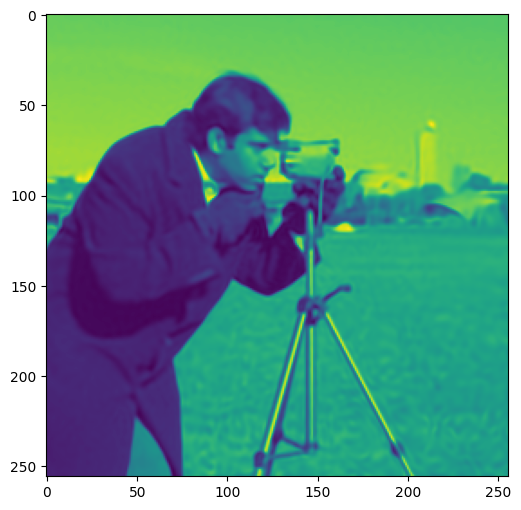

Step 490, Total loss 0.001009


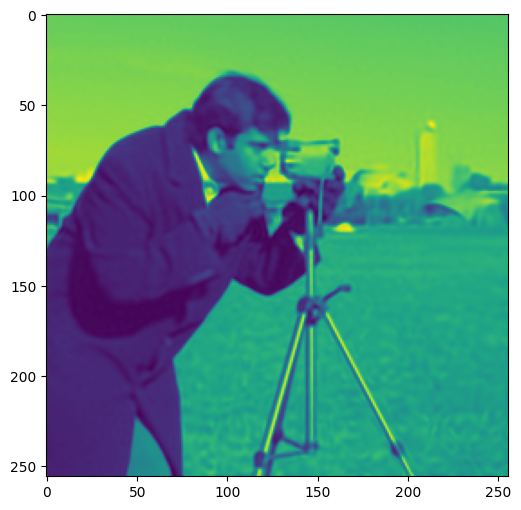

1457.1261031627655 초


In [ ]:
total_steps = 500 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

start = time.time()
for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        #img_grad = gradient(model_output, coords)
        #img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,1, figsize=(18,6))
        axes.imshow(model_output.cpu().view(256,256).detach().numpy())
        #axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        #axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()
end = time.time()
print(end-start,"초")

Step 499, Total loss 0.000983
model:  fp32  	 Size (KB): 796.451
model:  int8  	 Size (KB): 207.591
3.84 times smaller
mean absolute value of output tensor values in the FP32 model is 0.50001 
mean absolute value of output tensor values in the INT8 model is 0.49885 
mean absolute value of the difference between the output tensors is 0.02983 or 5.97 percent
INT8 loss 0.006608


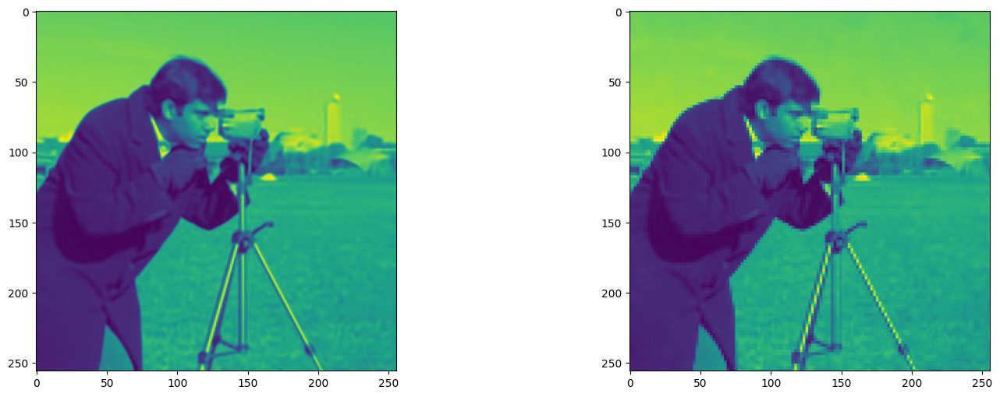

In [ ]:
print("Step %d, Total loss %0.6f" % (step, loss))
fig, axes = plt.subplots(1, 2, figsize=(18,6))
axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())

#양자화
img_siren_int8 = torch.ao.quantization.quantize_dynamic(img_siren, {torch.sin, torch.nn.Linear}, dtype=torch.qint8)

#사이즈 비교용
def print_size_of_model(model, label=""):
    torch.save(model.state_dict(), "temp.p")
    size=os.path.getsize("temp.p")
    print("model: ",label,' \t','Size (KB):', size/1e3)
    os.remove('temp.p')
    return size

f=print_size_of_model(img_siren,"fp32")
q=print_size_of_model(img_siren_int8,"int8")
print("{0:.2f} times smaller".format(f/q))

#아마 손실률 확인용
out1, hidden1 = img_siren(model_input)
mag1 = torch.mean(abs(out1)).item()
print('mean absolute value of output tensor values in the FP32 model is {0:.5f} '.format(mag1))

out2, hidden2 = img_siren_int8(model_input)
mag2 = torch.mean(abs(out2)).item()
print('mean absolute value of output tensor values in the INT8 model is {0:.5f} '.format(mag2))

mag3 = torch.mean(abs(out1-out2)).item()
print('mean absolute value of the difference between the output tensors is {0:.5f} or {1:.2f} percent'.format(mag3,mag3/mag1*100))

loss = ((out2 - ground_truth)**2).mean()
print("INT8 loss %0.6f" % (loss))
axes[1].imshow(out2.view(256,256).detach().numpy())
plt.show()